# pySCENIC protocol: downstream analyses

In [1]:
###################################
# Created on 17:00, Feb. 1st, 2021
# Author: fassial
# Filename: gen_figs.sleep.ipynb
###################################

## common dep & macro

In [2]:
# dep
import os
import json
import zlib
import base64
import pickle
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
# local dep

/home/fassial/Documents/storage/Software/anaconda/envs/python36/lib/python3.6/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [3]:
## set config
# set config for sc
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(
    dpi = 150,
    fontsize = 10,
    dpi_save = 600
)
# set maximum number of jobs for sc
sc.settings.njobs = 16

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.8.3 louvain==0.6.1


In [4]:
def save_obj(obj, filename):
    with open(filename, "wb") as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(filename):
    with open(filename, "rb") as f:
        return pickle.load(f)

In [5]:
# macro
# macro for expr
SEED_CURR = 0
EXPR_CURR = "sleep"
# macro for filepath
DIR_ROOT = os.path.join(os.getcwd(), "..", "..")
DIR_DATA = os.path.join(DIR_ROOT, "data")
DIR_RESOURCE = os.path.join(DIR_ROOT, "resource")
DIR_OUTPUT = os.path.join(DIR_ROOT, "output")
# macro for sce_adata file
SCE_ADATA_FNAME = "sce_adata.pkl"
# macro for scenic files
ADJ_FNAME = "adjacencies.tsv"
REGULONS_FNAME = "regulons.csv"
SCENIC_FNAME = "cells.scenic.loom"
# macro for motifs table
BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

In [6]:
# macro for metadata file
FILE_METADATA = os.path.join(DIR_DATA, "cells." + EXPR_CURR + ".metadata.csv")

## load data

### load data from scenic.src

In [7]:
# get sce_mtx & auc_mtx
lf = lp.connect(
    filename = os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), SCENIC_FNAME),
    mode = "r+",
    validate = False
)
sce_mtx = pd.DataFrame(lf[:,:], index = lf.ra.Gene, columns = lf.ca.CellID).T
auc_mtx = pd.DataFrame(lf.ca.RegulonsAUC, index = lf.ca.CellID)
regulons = lf.ra.Regulons
lf.close()

### load data from metadata.csv

In [8]:
metadata = pd.read_csv(FILE_METADATA,
    sep = ",",
    index_col = 0
).sort_index(ascending=True)

### add metadata to sce_adata

In [9]:
## set sce_adata
sce_adata = anndata.AnnData(X = sce_mtx)
## set sce_adata.obs
# mito and genes/counts cuts
mito_genes = sce_adata.var_names.str.startswith("mt-")
# original obs
sce_adata.obs["n_genes"] = (sce_adata.X > 0).sum(axis=1)
sce_adata.obs["n_counts"] = sce_adata.X.sum(axis=1)
sce_adata.obs["perc_mito"] = np.sum(sce_adata[:, mito_genes].X, axis=1) / np.sum(sce_adata.X, axis=1)
# sort obs.index
sce_adata.obs = sce_adata.obs.sort_index(ascending=True)
# additional obs
sce_adata.obs["cell_type"] = np.array(metadata["cell_type"])
sce_adata.obs["group"] = np.array(metadata["group"])
sce_adata.obs["treat"] = np.array(metadata["treat"])

In [10]:
sce_adata.obs

,n_genes,n_counts,perc_mito,cell_type,group,treat
AAACCCAAGAAACACT-4,2105,4448.0,0.026754,Microglia,MG601,MG60
AAACCCAAGAAATGGG-7,1541,3020.0,0.008278,Microglia,MG602,MG60
AAACCCAAGACTCCGC-6,1530,3000.0,0.017000,Microglia,MG4831,MG483
AAACCCAAGCACTCTA-2,2403,5860.0,0.021843,Microglia,MG4801,MG480
AAACCCAAGCAGCACA-4,1455,2625.0,0.016762,Microglia,MG601,MG60
...,...,...,...,...,...,...
TTTGTTGTCGCATTGA-7,2266,4735.0,0.013516,Microglia,MG602,MG60
TTTGTTGTCGGCACTG-3,2128,5464.0,0.026903,Microglia,MG4832,MG483
TTTGTTGTCGGCAGTC-5,2745,7360.0,0.025951,Microglia,MGC2,MGC
TTTGTTGTCGGTGCAC-7,3623,10087.0,0.041836,Microglia,MG602,MG60


## pre-processing of expression data

In [ ]:
# save a copy of the raw data
sce_adata.raw = sce_adata

# Total-count normalize (library-size correct) to 10,000 reads/cell
sc.pp.normalize_per_cell(sce_adata,
    counts_per_cell_after = 1e4
)

# log transform the data.
sc.pp.log1p(sce_adata)

# identify highly variable genes.
sc.pp.highly_variable_genes(sce_adata,
    min_mean = 0.0125,
    max_mean = 3,
    min_disp = 0.5
)
sc.pl.highly_variable_genes(sce_adata)

# keep only highly variable genes:
sce_adata = sce_adata[:, sce_adata.var["highly_variable"]]

# AxisError: axis1: axis 1 is out of bounds for array of dimension 0
# Fixed by update scanpy's dep to the correct version
# regress out total counts per cell and the percentage of mitochondrial genes expressed
sc.pp.regress_out(sce_adata, ["n_counts", "perc_mito"]) #, n_jobs=args.threads)

# scale each gene to unit variance, clip values exceeding SD 10.
sc.pp.scale(sce_adata,
    max_value = 10
)

normalizing by total count per cell


### PCA

In [ ]:
# principal component analysis
sc.tl.pca(sce_adata, svd_solver = "arpack")
sc.pl.pca_variance_ratio(sce_adata, log = True)

In [ ]:
sce_adata

### Visualization of highly variable genes

In [ ]:
# dep
from MulticoreTSNE import MulticoreTSNE as TSNE

In [ ]:
# neighborhood graph of cells (determine optimal number of PCs here)
sc.pp.neighbors(sce_adata, n_neighbors = 15, n_pcs = 50)
# compute UMAP
sc.tl.umap(sce_adata)
# tSNE
tsne_inst = TSNE(n_jobs = 16)
sce_adata.obsm["X_tsne"] = tsne_inst.fit_transform(sce_adata.X)

In [ ]:
sce_adata

### Clustering

In [ ]:
# cluster the neighbourhood graph
sc.tl.louvain(sce_adata,resolution=0.4)
# plot umap
sc.pl.umap(sce_adata, color=["louvain"])

In [ ]:
# find marker genes
sc.tl.rank_genes_groups(sce_adata, "louvain", method="t-test")
sc.pl.rank_genes_groups(sce_adata, n_genes=25, sharey=False)

# sc.tl.rank_genes_groups(adata, 'louvain', method='logreg')
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
pd.DataFrame(sce_adata.uns["rank_genes_groups"]["names"]).head(10)

In [ ]:
sce_adata

## visualization of SCENIC's AUC matrix

In [20]:
# dep
import umap
from MulticoreTSNE import MulticoreTSNE as TSNE

In [21]:
# UMAP
umap_inst = umap.UMAP(
    n_neighbors = 10,
    min_dist = 0.4,
    metric = "correlation"
)
dr_umap = umap_inst.fit_transform(auc_mtx)
# tSNE
tsne_inst = TSNE(n_jobs = 16)
dr_tsne = tsne_inst.fit_transform(auc_mtx)

/home/fassial/Documents/storage/Software/anaconda/envs/python36/lib/python3.6/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home/fassial/Documents/storage/Software/anaconda/envs/python36/lib/python3.6/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/fassial/Documents/storage/Software/anaconda/envs/python36/lib/python3.6/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out 

In [22]:
sce_adata.obsm["X_scenic_tsne"] = dr_tsne
sce_adata.obsm["X_scenic_umap"] = dr_umap

In [23]:
sce_adata

AnnData object with n_obs × n_vars = 5506 × 7920 
    obs: 'n_genes', 'n_counts', 'perc_mito', 'cell_type_refined', 'cell_type_brief', 'treat', 'dose', 'duration', 'stim', 'louvain'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'louvain', 'louvain_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'X_scenic_tsne', 'X_scenic_umap'
    varm: 'PCs'

### write sce_adata to pkl file

In [24]:
save_obj(
    obj = sce_adata, 
    filename = os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), SCE_ADATA_FNAME)
)

---
# Dimensionality reduction plots

### read sce_adata from pkl file

In [8]:
if os.path.exists(os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), SCE_ADATA_FNAME)):
    sce_adata = load_obj(os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), SCE_ADATA_FNAME))

### Show both highly variable genes and SCENIC UMAP plots with Louvain clustering and cell type classifications

In [9]:
# dep
import seaborn as sns
import matplotlib.pyplot as plt

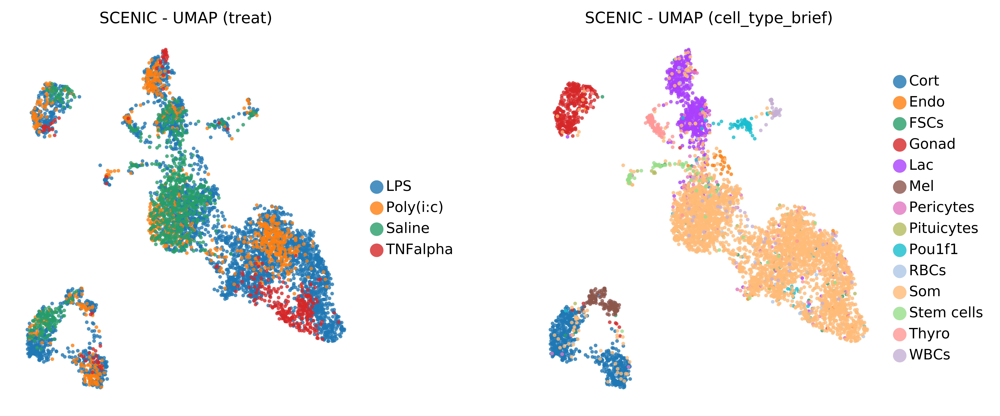

In [10]:
sc.set_figure_params(frameon=False, dpi=600, fontsize=10, dpi_save=600)

# sc.pl.scatter(sce_adata, basis="highly_variable_genes_UMAP", 
#     color=["Louvain_clusters_Scanpy", "Celltype_Garnett"],
#     title=["HVG - UMAP (Louvain clusters)", "HVG - UMAP (Cell type)"],
#     alpha=0.8,
#     save=None
# )

sc.pl.scatter(sce_adata, basis="scenic_umap", 
    color=["treat", "group"],
    title=["SCENIC - UMAP (treat)", "SCENIC - UMAP (group)"], 
    alpha=0.8,
    save=".pdf"
)

### Alternately, we can plot two dimensionality reductions side-by-side

(this uses non-Scanpy plotting functions)

In [11]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

In [12]:
sce_adata.obsm.index = sce_adata.obs.index

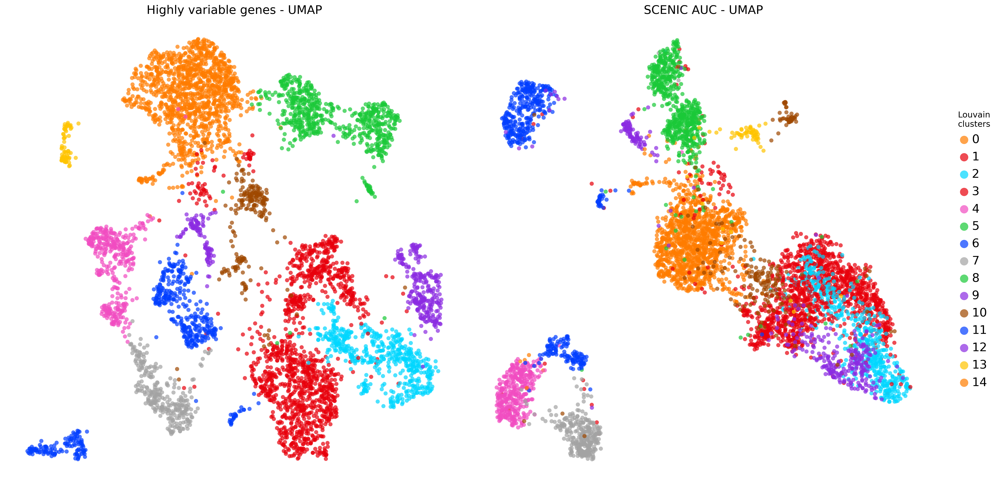

In [13]:
plt.rcParams.update({'font.size':12})

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10), dpi=150 )

dr = pd.DataFrame(sce_adata.obsm["X_umap"], index=sce_adata.obsm.index); dr.columns = ["X", "Y"]
drplot(dr, colorlab=sce_adata.obs["louvain"], ax=ax1, palette="bright", s=2, title="Highly variable genes - UMAP")

dr = pd.DataFrame(sce_adata.obsm["X_scenic_umap"], index=sce_adata.obsm.index); dr.columns = ["X", "Y"]
drplot(dr, colorlab=sce_adata.obs["louvain"], ax=ax2, palette="bright", s=2, title="SCENIC AUC - UMAP")
ax2.legend(loc="right", bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize="x-large", frameon=False, title="Louvain\nclusters")

plt.tight_layout()

---
# Motifs

## display motifs table

In [ ]:
# dep
import operator as op
from pyscenic.utils import load_motifs
from IPython.display import HTML, display

In [ ]:
## def utils
# def _display_motifstable func
def _display_motifstable(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return "<img src=\"{}{}.png\" style=\"max-height:124px;\"></img>".format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option("display.max_colwidth")
    pd.set_option("display.max_colwidth", 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option("display.max_colwidth", MAX_COL_WIDTH)

# def display_motifstable func
def display_motifstable(df_motifs: pd.DataFrame, selected_motifs: list = []):
    """
    :param df_motifs:
    :param selected_motifs:
    """
    # get df_motifs_sel
    if len(selected_motifs) == 0: df_motifs_sel = df_motifs.copy()
    else: df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values("TF") ] ,:]
    # display motifstable
    _display_motifstable(df_motifs_sel.sort_values([("Enrichment","NES")], ascending=False))

In [ ]:
# get motifs
motifs = load_motifs(os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), REGULONS_FNAME))

In [ ]:
# display motifstable
display_motifstable(
    df_motifs = motifs,
    selected_motifs = ["Nr3c1"]
)

## find target TF

In [ ]:
# def _find_motifs func
def _find_motifs(motifs: pd.DataFrame, selected_gene: str = ""):
    # init cor_motifs
    cor_motifs = []
    # get target_genes
    target_genes = motifs[("Enrichment", COLUMN_NAME_TARGETS)]
    # find selected genes
    for i in range(len(target_genes)):
        for j in range(len(target_genes[i])):
            if (selected_gene == target_genes[i][j][0]):
                cor_motifs.append(target_genes.index[i])
                break
    return cor_motifs

# def find_motifs func
def find_motifs(motifs: pd.DataFrame, selected_genes: list = []):
    # init cor_motifs
    cor_motifs = {}
    # find motifs for selected gene
    for gene in selected_genes:
        cor_motifs[gene] = _find_motifs(
            motifs = motifs,
            selected_gene = gene
        )
    return cor_motifs

In [ ]:
# get motifs
motifs = load_motifs(os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), REGULONS_FNAME))

In [ ]:
# find cor_motifs of selected genes
selected_genes = ["Crhr1", "Sstr5"]
cor_motifs = find_motifs(
    motifs = motifs,
    selected_genes = selected_genes
); cor_motifs

---
# Regulon specificity scores (RSS) across group

In [9]:
# dep
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize
import matplotlib as mpl

### Calculate RSS

In [10]:
rss_cellType = regulon_specificity_scores(auc_mtx, sce_adata.obs["group"])
rss_cellType

,Ahr(+),Arid3a(+),Arntl2(+),Ascl1(+),Atf1(+),Atf2(+),Atf3(+),Atf4(+),Atf5(+),Atf6(+),...,Zfp595(+),Zfp672(+),Zfp868(+),Zfp951(+),Zfp974(+),Zic3(+),Zkscan3(+),Zmiz1(+),Zscan21(+),Zxdc(+)
RBCs,0.193673,0.189356,0.188779,0.186595,0.190818,0.188929,0.190819,0.190436,0.194056,0.193095,...,0.179052,0.188493,0.185950,0.182260,0.186006,0.178903,0.194540,0.187644,0.182274,0.178382
Som,0.405083,0.528714,0.414501,0.533824,0.573589,0.546249,0.577613,0.599720,0.611671,0.611959,...,0.239926,0.564138,0.490831,0.296176,0.427865,0.270298,0.490047,0.557779,0.278223,0.214186
Gonad,0.176729,0.223913,0.193585,0.264137,0.220002,0.236774,0.223782,0.229456,0.202798,0.214613,...,0.183841,0.239945,0.211481,0.214864,0.226957,0.193113,0.213805,0.230983,0.179570,0.167445
Lac,0.187369,0.279768,0.232057,0.314983,0.272858,0.261236,0.267979,0.274708,0.235858,0.260612,...,0.199435,0.290667,0.286703,0.215777,0.271875,0.223640,0.253090,0.292534,0.218241,0.179074
Cort,0.232711,0.268288,0.240150,0.288084,0.273603,0.299551,0.286831,0.279112,0.231696,0.265022,...,0.234164,0.293646,0.314495,0.276278,0.310730,0.206084,0.250945,0.288065,0.232472,0.179845
Pou1f1,0.204950,0.195693,0.188312,0.192416,0.195781,0.192971,0.195724,0.195619,0.197770,0.194739,...,0.208098,0.194940,0.195092,0.174593,0.191687,0.180967,0.191338,0.195167,0.181467,0.172452
Mel,0.177550,0.202078,0.200390,0.214953,0.192573,0.196444,0.200400,0.198923,0.191806,0.197660,...,0.176620,0.200280,0.201766,0.212904,0.215874,0.232292,0.196711,0.202571,0.184518,0.171324
Endo,0.185494,0.183866,0.179855,0.181187,0.184345,0.182056,0.182880,0.183207,0.183562,0.183542,...,0.236275,0.183137,0.183065,0.176236,0.181073,0.184988,0.183213,0.189009,0.173807,0.173325
Thyro,0.175569,0.193419,0.189496,0.198066,0.187875,0.186370,0.186662,0.189307,0.179685,0.187014,...,0.178957,0.194491,0.188062,0.222852,0.194506,0.189362,0.191383,0.194765,0.186394,0.187969
Pituicytes,0.178240,0.173195,0.176969,0.174517,0.174849,0.174850,0.174922,0.174822,0.173522,0.174982,...,0.179388,0.174816,0.175140,0.172247,0.172147,0.206564,0.174629,0.175493,0.171294,0.167445


### RSS panel plot with all cell types

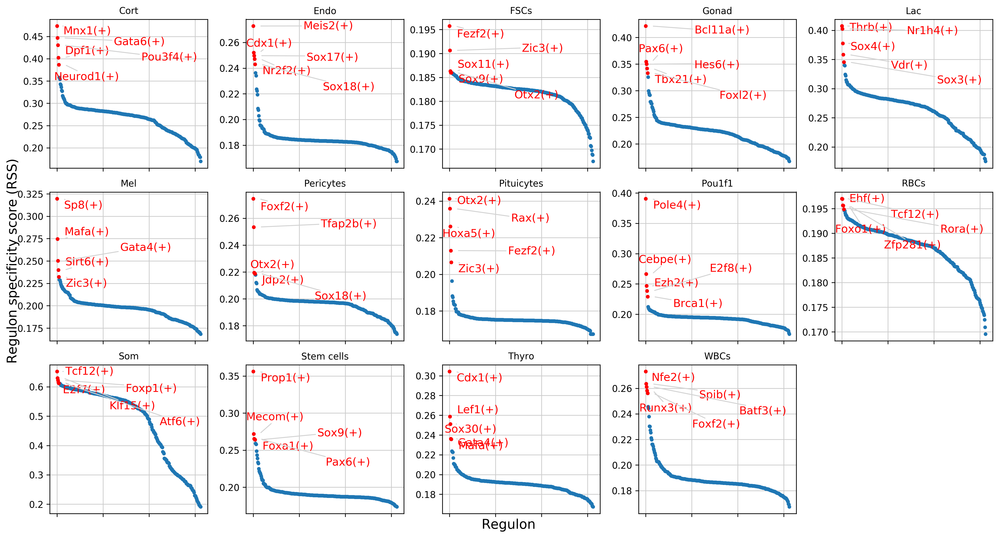

In [11]:
cats = sorted(list(set(sce_adata.obs["group"])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim(x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05)
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel("")
    ax.set_xlabel("")
    adjust_text(ax.texts,
        autoalign = "xy",
        ha = "right",
        va = "bottom",
        arrowprops = dict(arrowstyle="-",color="lightgrey"),
        precision=0.001
    )
 
fig.text(0.5, 0.0, "Regulon", ha="center", va="center", size="x-large")
fig.text(0.00, 0.5, "Regulon specificity score (RSS)", ha="center", va="center", rotation="vertical", size="x-large")
plt.tight_layout()
plt.rcParams.update({
    "figure.autolayout": True,
    "figure.titlesize": "large",
    "axes.labelsize": "medium",
    "axes.titlesize": "large",
    "xtick.labelsize": "medium",
    "ytick.labelsize": "medium"
})
# plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each cell type

In [12]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

#### Generate a Z-score for each regulon to enable comparison between regulons

In [13]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

#### Generate a heatmap

In [14]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ["k"] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment="center", verticalalignment="center")
    return f

In [15]:
colors = sns.color_palette("bright",n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [colorsd[x] for x in sce_adata.obs["cell_type_brief"]]

/home/fassial/Documents/storage/Software/anaconda/envs/python36/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


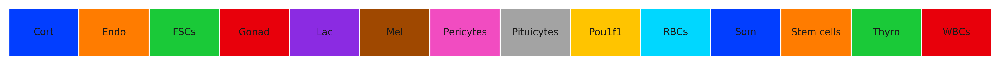

In [16]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
# plt.savefig("PBMC10k_cellType-heatmap-legend-top5.pdf", dpi=600, bbox_inches = "tight")

In [32]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg],
    # params for heatmap
    square=False, linecolor="gray",
    yticklabels=False, xticklabels=True,
    vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16)
)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_xlabel("")

Text(0.5, -445.827083333334, '')

In [33]:
g.savefig(os.path.join("figures", "group-heatmap-top5.pdf"), dpi=600, bbox_inches = "tight")

### Generate a binary regulon activity matrix:

In [17]:
binary_mtx, auc_thresholds = binarize(auc_mtx, num_workers=16)
binary_mtx.head()

,Ahr(+),Arid3a(+),Arntl2(+),Ascl1(+),Atf1(+),Atf2(+),Atf3(+),Atf4(+),Atf5(+),Atf6(+),...,Zfp595(+),Zfp672(+),Zfp868(+),Zfp951(+),Zfp974(+),Zic3(+),Zkscan3(+),Zmiz1(+),Zscan21(+),Zxdc(+)
AACTCACC_L02,0,0,1,0,1,0,0,1,1,1,...,0,0,0,1,0,0,0,0,0,0
AACTCACC_L09,0,0,0,0,1,0,1,0,1,0,...,0,0,0,0,1,0,1,0,0,0
AACTCACC_L10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
AACTCACC_L100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
AACTCACC_L101,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0


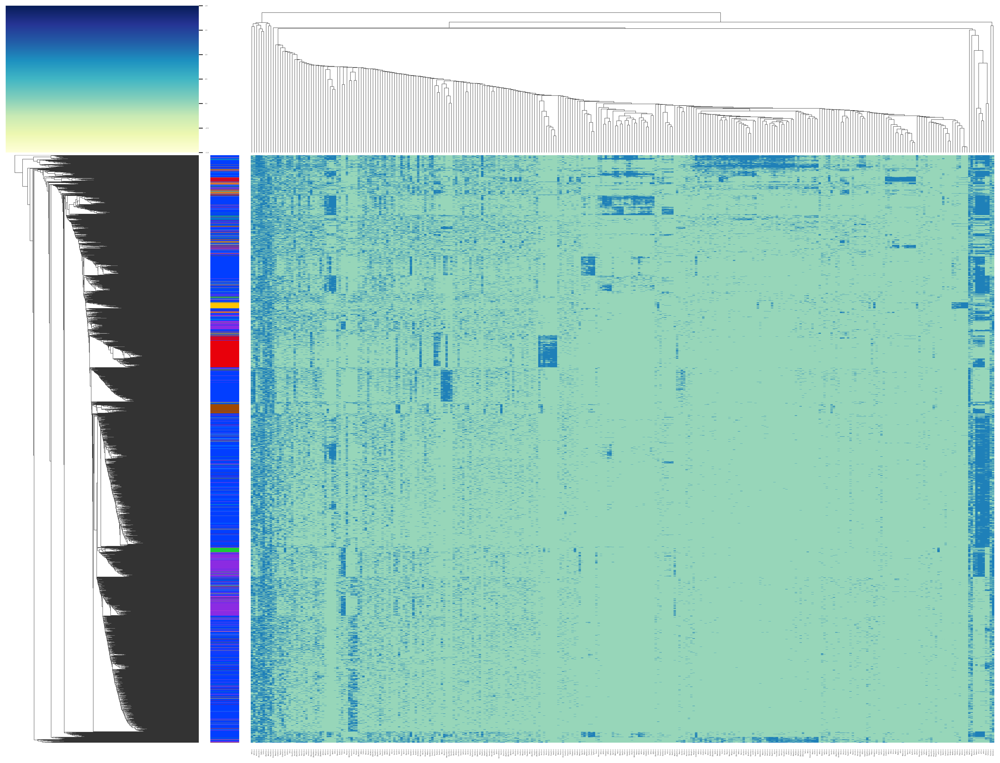

In [18]:
sns.set(font_scale=0.2)
g = sns.clustermap(binary_mtx,
    # params for heatmap
    square=False, linecolor="gray",
    yticklabels=False, xticklabels=True,
    vmin=-1, vmax=2, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16)
)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_xlabel("")
g.savefig(os.path.join("figures", "group-heatmap-all.pdf"), dpi=600, bbox_inches = "tight")

### Show the AUC distributions for selected regulons

In [ ]:
# select regulons:
r = ["Ahr_(+)", "Atf3_(+)", "Zfp950_(+)"]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot([ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), "r:")
    ax.title.set_text(r[i])
    ax.set_xlabel("")
    
fig.text(-0.01, 0.5, "Frequency", ha="center", va="center", rotation="vertical", size="large")
fig.text(0.5, -0.01, "AUC", ha="center", va="center", rotation="horizontal", size="large")

fig.tight_layout()
# fig.savefig("PBMC10k_cellType-binaryPlot2.pdf", dpi=600, bbox_inches="tight")

---
# Regulon specificity scores (RSS) across Louvain clusters

### Calculate RSS

In [ ]:
rss_louvain = regulon_specificity_scores( auc_mtx, cellAnnot["Louvain_clusters_Scanpy"] )
rss_louvain

### RSS panel plot with all cell types

In [ ]:
cats = sorted( list(set(cellAnnot["Louvain_clusters_Scanpy"])), key=int )

fig = plt.figure(figsize=(15, 12))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_louvain.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_louvain, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel("")
    ax.set_xlabel("")
    adjust_text(ax.texts,
        autoalign = "xy",
        ha = "right",
        va = "bottom",
        arrowprops = dict(arrowstyle="-", color="lightgrey"),
        precision = 0.001
    )
 
fig.text(0.5, 0.0, "Regulon", ha="center", va="center", size="x-large")
fig.text(0.00, 0.5, "Regulon specificity score (RSS)", ha="center", va="center", rotation="vertical", size="x-large")
plt.tight_layout()
plt.rcParams.update({
    "figure.autolayout": True,
    "figure.titlesize": "large",
    "axes.labelsize": "medium",
    "axes.titlesize": "large",
    "xtick.labelsize": "medium",
    "ytick.labelsize": "medium"
})
# plt.savefig("PBMC10k_Louvain-RSS-top5.png", dpi=150, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each cell type

In [ ]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_louvain.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

#### Generate a heatmap

In [ ]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ["k"] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment="center", verticalalignment="center")
    return f

In [ ]:
colors = sns.color_palette("bright",n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [colorsd[x] for x in cellAnnot["Louvain_clusters_Scanpy"]]

In [ ]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)

In [ ]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor="gray",
    yticklabels=False, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16)
)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_xlabel("")

---
# Further exploration of modules directly from the network inference output

In [ ]:
adjacencies = pd.read_csv(os.path.join(DIR_OUTPUT, ("seed-%d" % SEED_CURR), ADJ_FNAME),
    index_col = False,
    sep = "\t"
)

Create the modules:

In [ ]:
from pyscenic.utils import modules_from_adjacencies
modules = list(modules_from_adjacencies(adjacencies, sce_mtx))

#### pick out modules for EBF1:

In [ ]:
tf = "EBF1"
tf_mods = [ x for x in modules if x.transcription_factor==tf ]

for i,mod in enumerate( tf_mods ):
    print(f"{tf} module {str(i)}: {len(mod.genes)} genes")
print(f"{tf} regulon: {len(regulons[tf+\"_(+)\"])} genes")

write these modules, and the regulon to files:

In [ ]:
for i,mod in enumerate(tf_mods):
    with open(tf+"_module_"+str(i)+".txt", "w") as f:
        for item in mod.genes:
            f.write("%s\n" % item)
            
with open(tf+"_regulon.txt", "w") as f:
    for item in regulons[tf+"_(+)"]:
        f.write("%s\n" % item)

### These module files can be further explored in **[iRegulon](http://iregulon.aertslab.org/).**

A detailed iRegulon tutorial is available [here](http://iregulon.aertslab.org/tutorial.html)

This can produce, for example, the following image:

In [ ]:
from IPython.display import display, Image
display(Image(filename='iRegulon_screenshot_PBMC10k-EBF1.png'))